## Task 1: Logistics Delay (Komponente K7)
### - Distribution analysis
### - Mean delay & interpretation
### - Visualization (Histogram + Density)
### - Decision tree for defect prediction

In [29]:
# === 统一路径 & 读取工具（通用于本地/Colab）===
from pathlib import Path
import sys
import pandas as pd

# 0) 自动定位项目根目录（保证不写 D:/）
def detect_project_root() -> Path:
    here = Path.cwd()  # 你现在在哪儿打开的 .ipynb
    # 从当前目录往上找，谁里面有 Komponente/Logistikverzug 就把谁当根目录
    for p in [here, *here.parents]:
        if (p / "Komponente").exists() or (p / "Logistikverzug").exists():
            return p
    # Colab 兜底（如果你把项目放在这个位置）
    if "google.colab" in sys.modules:
        cand = Path("/content/drive/MyDrive/Case_Study_IDA_Group11")
        if (cand / "Komponente").exists() or (cand / "Logistikverzug").exists():
            return cand
    return here  # 实在找不到就用当前目录

PROJECT_ROOT = detect_project_root()
DATA_DIR     = PROJECT_ROOT      # ✅ 不再进入 Data 文件夹，直接用根目录
OUTPUT_DIR   = PROJECT_ROOT / "outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print("PROJECT_ROOT =", PROJECT_ROOT)
print("DATA_DIR     =", DATA_DIR)
print("OUTPUT_DIR   =", OUTPUT_DIR)

# 1) 搜索工具：在 DATA_DIR 下递归找最匹配的文件
def find_one(root: Path, patterns):
    """在 root 下递归查找符合任一 pattern 的文件，返回最可能的那个"""
    cands = []
    for pat in patterns:
        cands += list(root.rglob(pat))
    if not cands:
        raise FileNotFoundError(f"在 {root} 下没找到：{patterns}")
    # 路径更短优先、修改时间更新优先
    cands.sort(key=lambda p: (len(p.parts), -p.stat().st_mtime))
    return cands[0]

# 可能的命名：Komponente/Bestandteile…K7.*；Logistikverzug…K7.*
k7_comp_path = find_one(
    DATA_DIR, [
        "Komponente/*K7*.csv", "Komponente/*K7*.xls*", "Komponente/*K7*.txt",
        "**/Komponente*/*K7*.csv", "**/Komponente*/*K7*.xls*", "**/Komponente*/*K7*.txt",
        "**/*Komponente*K7*.csv", "**/*Komponente*K7*.xls*", "**/*Komponente*K7*.txt"
    ]
)
k7_logi_path = find_one(
    DATA_DIR, [
        "Logistikverzug/*K7*.csv", "Logistikverzug/*K7*.xls*", "Logistikverzug/*K7*.txt",
        "**/Logistik*verzug*/*K7*.csv", "**/Logistik*verzug*/*K7*.xls*", "**/Logistik*verzug*/*K7*.txt"
    ]
)

print("Component file:", k7_comp_path)
print("Logistics file:", k7_logi_path)

# 2) 读取工具（自动识别编码/分隔符/Excel）
def read_any(path: Path) -> pd.DataFrame:
    suf = path.suffix.lower()
    if suf in [".xls", ".xlsx"]:
        return pd.read_excel(path)
    # CSV/TXT：自动推断分隔符，尝试常见编码
    for enc in [None, "utf-8-sig", "latin-1", "cp1252"]:
        try:
            return pd.read_csv(path, sep=None, engine="python", encoding=enc)
        except UnicodeDecodeError:
            continue
    # 如果都失败，让错误更清楚
    return pd.read_csv(path)  # 抛出原生错误

comp_raw = read_any(k7_comp_path)
logi_raw = read_any(k7_logi_path)

print("Komponente preview:", comp_raw.shape, list(comp_raw.columns)[:8])
print("Logistikverzug preview:", logi_raw.shape, list(logi_raw.columns)[:8])

# 3) 统一列名（去空格；必要时可加 .str.lower()）
def norm_cols(df: pd.DataFrame):
    df = df.copy()
    df.columns = [c.strip() for c in df.columns]
    return df

comp = norm_cols(comp_raw)
logi = norm_cols(logi_raw)

comp.head(3), logi.head(3)


PROJECT_ROOT = D:\IDA\Case_Study_IDA_Group11
DATA_DIR     = D:\IDA\Case_Study_IDA_Group11
OUTPUT_DIR   = D:\IDA\Case_Study_IDA_Group11\outputs
Component file: D:\IDA\Case_Study_IDA_Group11\Data\Komponente\Komponente_K7.txt
Logistics file: D:\IDA\Case_Study_IDA_Group11\Data\Logistikverzug\Logistikverzug_K7.csv
Komponente preview: (306490, 9) ['X1', 'ID_Karosserie', 'Herstellernummer', 'Werksnummer', 'Fehlerhaft', 'Fehlerhaft_Datum', 'Fehlerhaft_Fahrleistung', 'Produktionsdatum_Origin_01011970']
Logistikverzug preview: (306490, 6) ['Unnamed: 0', 'IDNummer', 'Wareneingang', 'Herstellernummer', 'Werksnummer', 'Fehlerhaft']


(   X1  ID_Karosserie  Herstellernummer  Werksnummer  Fehlerhaft  \
 1   1  K7-114-1142-1               114         1142           0   
 2   2  K7-114-1142-2               114         1142           0   
 3   3  K7-114-1142-5               114         1142           0   
 
   Fehlerhaft_Datum  Fehlerhaft_Fahrleistung  Produktionsdatum_Origin_01011970  \
 1              NaN                        0                             14195   
 2              NaN                        0                             14195   
 3              NaN                        0                             14196   
 
        origin  
 1  01-01-1970  
 2  01-01-1970  
 3  01-01-1970  ,
    Unnamed: 0            IDNummer Wareneingang  Herstellernummer  Werksnummer  \
 0           1  K7-113-1132-153160   2016-11-22               112         1132   
 1           2  K7-113-1132-153109   2016-11-20               112         1132   
 2           3  K7-113-1132-153195   2016-11-20               112         1132   

In [31]:
import pandas as pd
import re

# --- 0) 护栏：确保先跑过 Cell1 ---
if "comp" not in globals() or "logi" not in globals():
    raise RuntimeError("Please run Task1 Cell1 first (read Komponente/Logistikverzug data).")

# --- 1) 宽松列名匹配工具（忽略大小写和多余空格/下划线） ---
def find_col(df, candidates):
    norm = {re.sub(r"[^0-9a-z]+", "_", c.lower()).strip("_"): c for c in df.columns}
    for key in candidates:
        k = re.sub(r"[^0-9a-z]+", "_", key.lower()).strip("_")
        # 完整匹配优先
        if k in norm:
            return norm[k]
        # 包含匹配兜底
        for nk, orig in norm.items():
            if k in nk:
                return orig
    return None

# ===== 设定关键列（给出多个备选以兼容不同命名）=====
comp_id_cands   = ["ID_Karosserie", "IDKarosserie", "karosserie_id", "karosserieid"]
logi_id_cands   = ["IDNummer", "ID_Nummer", "idnummer"]
prod_cands      = ["Produktionsdatum_Origin_01011970", "Produktionsdatum_Origin", "Produktionsdatum"]
arrival_cands   = ["Wareneingang", "Waren_eingang", "wareneingang_datum", "arrival"]

key_comp    = find_col(comp, comp_id_cands)
key_logi    = find_col(logi, logi_id_cands)
col_prod    = find_col(comp, prod_cands)
col_arrival = find_col(logi, arrival_cands)

# 给出友好提示
missing = []
if key_comp is None:    missing.append(f"Komponente missing ID column (candidates: {comp_id_cands})")
if key_logi is None:    missing.append(f"Logistikverzug missing ID column (candidates: {logi_id_cands})")
if col_prod is None:    missing.append(f"Komponente missing production date column (candidates: {prod_cands})")
if col_arrival is None: missing.append(f"Logistikverzug missing arrival date column (candidates: {arrival_cands})")
if missing:
    print("⚠️ Column auto-matching failed, missing columns:")
    for m in missing: print("   -", m)
    print("\nKomponente sample columns:", list(comp.columns)[:12])
    print("Logistikverzug sample columns:", list(logi.columns)[:12])
    raise ValueError("Please add your actual column names to the candidate lists above.")

print("Matched columns:", {"key_comp":key_comp, "key_logi":key_logi, "col_prod":col_prod, "col_arrival":col_arrival})

# ===== 2) 转日期 =====
origin = pd.Timestamp("1970-01-01")
comp["Production_date"] = origin + pd.to_timedelta(pd.to_numeric(comp[col_prod], errors="coerce"), unit="D")

logi[col_arrival] = pd.to_datetime(logi[col_arrival], dayfirst=False, errors="coerce")
print("Invalid arrival date count:", logi[col_arrival].isna().sum())

# ===== 3) 发货日期 = 生产日期 + 1 天 =====
comp["Shipping_date"] = comp["Production_date"] + pd.Timedelta(days=1)

# ===== 4) 合并 =====
need_cols_comp = [key_comp, "Shipping_date"] + ([c for c in ["Fehlerhaft"] if c in comp.columns])
need_cols_logi = [key_logi, col_arrival] + ([c for c in ["Fehlerhaft"] if c in logi.columns])

df = comp[need_cols_comp].merge(
    logi[need_cols_logi],
    left_on=key_comp, right_on=key_logi,
    how="inner"
)

# ===== 5) 延迟天数 =====
df["Logistics_delay"] = (df[col_arrival] - df["Shipping_date"]).dt.days

# ===== 6) 输出检查 =====
print("Merged rows:", df.shape[0])
print("Delay column description:")
print(df["Logistics_delay"].describe())

print(df[["Shipping_date", col_arrival, "Logistics_delay"]].head())

# ===== 7) 保存 =====
out_path = OUTPUT_DIR / "task1_logistics_delay.csv"
df.to_csv(out_path, index=False, encoding="utf-8-sig")
print("Result saved to:", out_path)


Matched columns: {'key_comp': 'ID_Karosserie', 'key_logi': 'IDNummer', 'col_prod': 'Produktionsdatum_Origin_01011970', 'col_arrival': 'Wareneingang'}
Invalid arrival date count: 0
Merged rows: 306490
Delay column description:
count    306490.000000
mean          6.080437
std           1.012302
min           3.000000
25%           5.000000
50%           6.000000
75%           7.000000
max          14.000000
Name: Logistics_delay, dtype: float64
  Shipping_date Wareneingang  Logistics_delay
0    2008-11-13   2008-11-19                6
1    2008-11-13   2008-11-19                6
2    2008-11-14   2008-11-19                5
3    2008-11-14   2008-11-19                5
4    2008-11-14   2008-11-19                5
Result saved to: D:\IDA\Case_Study_IDA_Group11\outputs\task1_logistics_delay.csv


[a] Normality tests:
    Shapiro-Wilk p = 1.211e-49
    Kolmogorov-Smirnov p = 1.249e-239
    Conclusion: At least one test rejects normality; delays are non-normal (skewed/long-tailed/discrete).

[b] Delay statistics:
    Mean = 6.08 days
    Median = 6.00 days
    Std = 1.01 days
    Interpretation: Mean ≈ median → distribution is roughly symmetric.


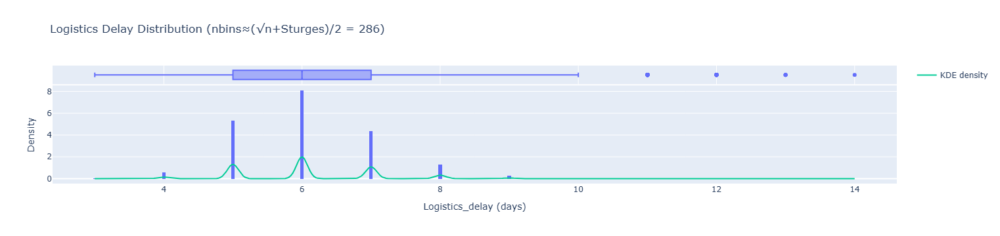


[c] Binning rationale: sample size n=306490.
    √n rule → nbins=553; Sturges' rule → nbins=20.
    We take a middle ground nbins=286 to avoid overly coarse or overly jittery bins.


In [32]:
# === 第三格：分布检验 + 平均值 + 可视化 ===
import numpy as np
import pandas as pd
import scipy.stats as stats
import plotly.express as px
import plotly.graph_objects as go

# 取出延迟列，去掉缺失
x = df["Logistics_delay"].dropna().astype(float)

# -------- (a) 正态性检验 --------
# 样本很大时 Shapiro 会强检，可抽样到 5000 再检验；非常大也可用 K-S
sample = x.sample(min(len(x), 5000), random_state=0) if len(x) > 5000 else x.copy()

shapiro_stat, shapiro_p = stats.shapiro(sample)
ks_stat, ks_p = stats.kstest(
    (sample - sample.mean())/sample.std(ddof=0),  # 标准化到 N(0,1)
    'norm'
)

print("[a] Normality tests:")
print(f"    Shapiro-Wilk p = {shapiro_p:.4g}")
print(f"    Kolmogorov-Smirnov p = {ks_p:.4g}")
if shapiro_p > 0.05 and ks_p > 0.05:
    print("    Conclusion: Both tests fail to reject normality; delays can be approximated as normal.")
else:
    print("    Conclusion: At least one test rejects normality; delays are non-normal (skewed/long-tailed/discrete).")

# -------- (b) 平均延迟（含解释）--------
mean_delay   = x.mean()
median_delay = x.median()
std_delay    = x.std(ddof=1)

print("\n[b] Delay statistics:")
print(f"    Mean = {mean_delay:.2f} days")
print(f"    Median = {median_delay:.2f} days")
print(f"    Std = {std_delay:.2f} days")
if mean_delay > median_delay + 0.5:
    print("    Interpretation: Mean >> median → a few slow orders pull the mean upward (right-skew/long tail).")
elif median_delay > mean_delay + 0.5:
    print("    Interpretation: Median > mean → possible left-skew (a few extremely fast records).")
else:
    print("    Interpretation: Mean ≈ median → distribution is roughly symmetric.")

# -------- (c) 直方图 + 简易密度曲线 --------
n = len(x)
nbins_sqrt     = max(10, int(np.sqrt(n)))
nbins_sturges  = int(np.ceil(np.log2(n) + 1))
nbins = int(round((nbins_sqrt + nbins_sturges)/2))

fig = px.histogram(
    x=x,  # 这里直接传 Series
    nbins=nbins,
    histnorm="probability density",
    title=f"Logistics Delay Distribution (nbins≈(√n+Sturges)/2 = {nbins})",
    marginal="box"
)

# 叠加 KDE（可选）
try:
    if x.std(ddof=0) > 0 and len(x) > 3:
        kde = stats.gaussian_kde(x)
        xs = np.linspace(x.min(), x.max(), 400)
        ys = kde(xs)
        fig.add_trace(go.Scatter(x=xs, y=ys, mode="lines", name="KDE density"))
except Exception as e:
    print("KDE computation failed; histogram unaffected:", e)

fig.update_layout(xaxis_title="Logistics_delay (days)", yaxis_title="Density")
fig.show()

# 可选：导出图
fig.write_html(str(OUTPUT_DIR / "task1_delay_hist.html"))
print(f"\n[c] Binning rationale: sample size n={n}.")
print(f"    √n rule → nbins={nbins_sqrt}; Sturges' rule → nbins={nbins_sturges}.")
print(f"    We take a middle ground nbins={nbins} to avoid overly coarse or overly jittery bins.")


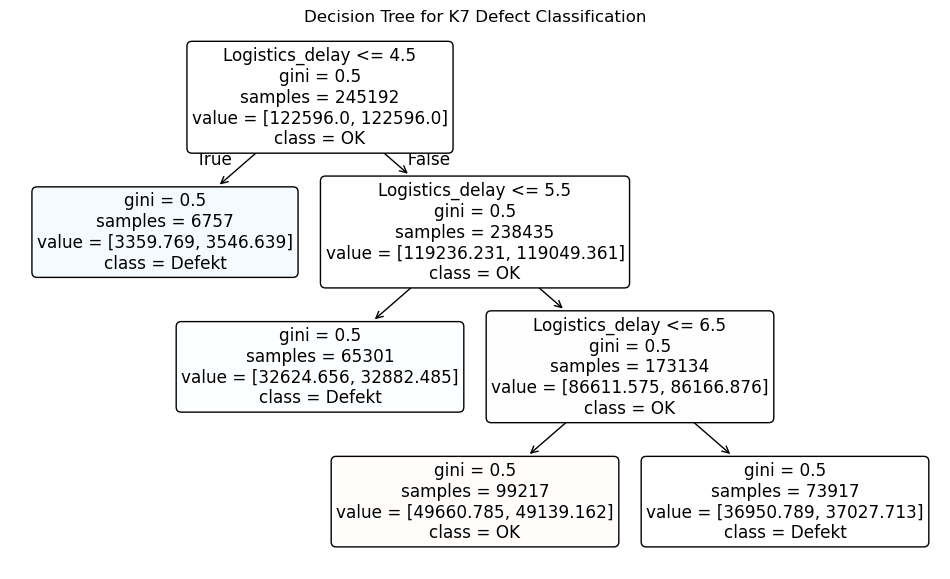

=== Classification Report ===
              precision    recall  f1-score   support

          OK       0.90      0.41      0.56     55154
      Defekt       0.10      0.59      0.17      6144

    accuracy                           0.42     61298
   macro avg       0.50      0.50      0.37     61298
weighted avg       0.82      0.42      0.52     61298

AUC = 0.498

=== Feature Importances ===
Logistics_delay    1.0
dtype: float64


In [13]:
# === 第四格：决策树分类（K7 是否缺陷）===
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score

# 1) 自动定位标签列（按优先级）
label_candidates = [
    "Fehlerhaft", "Fehlerhaft_x", "Fehlerhaft_y",
    "Defekt", "Fehler", "Faulty"
]
label_col = None
for c in label_candidates:
    if c in df.columns:
        label_col = c
        break
if label_col is None:
    raise KeyError("未找到缺陷标签列（Fehlerhaft/Defekt/Fehler…）。请确认 df 里是否存在。")

# 把标签标准化为 0/1
def to_binary(s):
    s = s.astype(str).str.strip().str.lower()
    mapping = {
        "1":1, "true":1, "ja":1, "yes":1, "y":1, "defekt":1, "fehlerhaft":1,
        "0":0, "false":0, "nein":0, "no":0, "n":0, "ok":0, "nicht fehlerhaft":0
    }
    return s.map(mapping).astype("float")

y = to_binary(df[label_col])
# 2) 选择特征
num_feats = ["Logistics_delay"]
cat_feats = [c for c in ["Herstellernummer", "Werksnummer"] if c in df.columns]

X = df[num_feats + cat_feats].copy()

# 去掉缺失
data = pd.concat([X, y.rename("label")], axis=1).dropna(subset=["Logistics_delay","label"])
X = data[num_feats + cat_feats]
y = data["label"].astype(int)

# 独热编码（若有分类特征）
X = pd.get_dummies(X, columns=cat_feats, drop_first=True)

# 3) 划分训练/测试集（分层抽样以处理类不平衡）
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=0, stratify=y
)

# 4) 训练一棵浅层树（更易解释；类不平衡用 balanced）
clf = DecisionTreeClassifier(
    max_depth=3, min_samples_leaf=50, class_weight="balanced", random_state=0
)
clf.fit(X_train, y_train)

# 5) 可视化决策树
plt.figure(figsize=(12, 7))
plot_tree(
    clf,
    feature_names=X.columns.tolist(),
    class_names=["OK","Defekt"],
    filled=True, rounded=True, impurity=True
)
plt.title("Decision Tree for K7 Defect Classification")
plt.show()

# 6) 评估
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:,1] if hasattr(clf, "predict_proba") else None

print("=== Classification Report ===")
print(classification_report(y_test, y_pred, target_names=["OK","Defekt"]))
if y_proba is not None and len(np.unique(y_test)) == 2:
    try:
        auc = roc_auc_score(y_test, y_proba)
        print(f"AUC = {auc:.3f}")
    except Exception:
        pass

# 7) 输出特征重要性（看延迟阈值是否关键）
imp = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\n=== Feature Importances ===")
print(imp.head(10))
